# Statoil/C-core Iceberg

**Data**의 **Pattern**을 찾아가는 고민에 초점을 맞춰서 진행
> * Uploaded: 2022-03-12
> * Dataset: https://www.kaggle.com/c/statoil-iceberg-classifier-challenge

## 1. Overview
---

### 🔸 Description
* 캐나다의 동부 해안 연안과 같은 지역에서 **drifting Icebergs들이 항해의 위협**이 됨
* 기존의 직접 감시하고 관찰하는 aerial reconnaissance나 shore-based support같은 monitoring 방식은 기상 악화에 영향을 많이 받기 때문에 **satellite를 통한 monitoring**이 필요
* **Satellite data에서 Iceberg와 Ship을 구분하는 Vision system을 개발**하기 위해서 Statoil (International energy company)과 C-Core(Satellite data vision system company)가 함께 해당 competition을 개최하게 되었다.

### 🔸 Evaluation
* GT와 Pred의 **log loss**를 통한 평가
* Submission file 형태
    * `id`: test sample image id
    * `is_iceberg`: 해당 이미지가 Iceberg를 포함할 확률(0~1)
<br>

![image.png](attachment:f6f76581-1be7-42a3-b752-419423db1f9c.png "sample_submission")
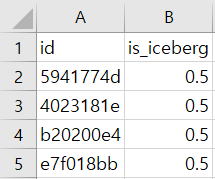

### 🔸 Background
* Sentinel-1이라는 satellite는 매일 정해진 시간과 위치에서 earth의 사진을 확보하여 land와 ocean을 구별하는 데 사용되고 있음. 자체적인 energy를 방출하여 darkness, rain, cloud, fog등 **시간대와 기상 상태에 영향을 받지 않는 C-Band radar를 사용**함
* Satellite blip에서 Ship 또는 Aircraft같은 object를 찾기 위해서는, 우선 **radar 신호를 보내고 반사되어 돌아온 data를 image로 변환**함.(**Backscatter**: 반사되어 돌아온 radar) object가 있는 영역은 그 주변부보다 더 많은 radar energy를 반사하기 때문에 더욱 밝게 출력됨.

![image.png](attachment:505d866b-21cd-48b1-ba74-c3d526c117f9.png "모든 고체가 있는 영역이 bright spot으로 출력됨 (backscatter가 커서)")
* Spot의 brightness로 object의 존재 유무만 판단할 수 있기 때문에, 해당 영역의 object가 ship인지 다른 solid object인지는 판단할 수 없음. 따라서 **Shape, size, brightness와 같은 특성들로 object를 분석**해야 함.
* Background나 ocean의 **backscatter에 영향을 주는 조건**들이 또 있는데, 
    * **바람의 세기**가 강할수록 background는 더 밝아지고, 바람의 세기가 약할수록 background는 어두워짐. 
    * 어떠한 각도를 두고 radar를 반사시킬 경우, **incidence angle**이 높을수록 background는 어두워짐.
    * Radar polarization(radar가 energy를 송수신하는 방식)이 더 advanced일 경우 수평면과 수직면에서 radar를 송수신할 수 있음. 이 방식을 통해 **Dual-polarization image**를 얻을 수 있음. 두 가지의 방식에서 object가 반사하는 energy의 크기가 다름.
* 이 대회에서는, Dual-polarization을 활용하여 두 가지 channel의 data가 주어짐. **두 가지의 image data를 모두 활용하여 prediction**을 만들어야 함.
    * **HH (Horizontal하게 송수신)**
    * **HV (Vertical하게 송수신)**
    
![image.png](attachment:ade55eab-d215-4cfb-8f45-bb7dc47a343c.png "Classify가 수월한 경우(좌)와 Classify가 수월하지 않은 경우(우)")
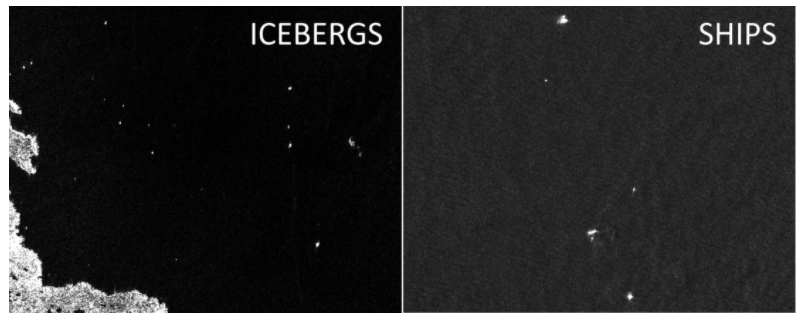
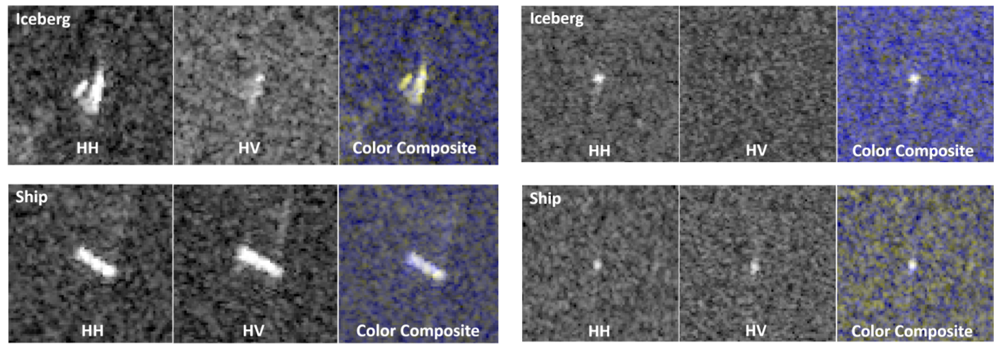

### 🔸 Data Description
* Image Size: 75x75
* 이미지들을 포함하고 있는 `train.json` 과 `test.json` 데이터 활용
    * `id` : sample image의 id값
    * `band_1, band_2` : 각 75x75 image가 flatten된 5625개씩의 data(integer가 아닌 float 사용). band_1과 band_2는 각각 다른 incidence angle에서 촬영된 두 개의 radar backscatter(HH와 HV)를 나타낸다.
    * `inc_angle` : 해당 image를 얻은 incidence angle. “NA” sample 다수 존재.
    * `is_iceberg` : train.json 에만 존재하는 target value로, iceberg면 1로, ship이면 0으로 되어있다.

## 2. EDA
---

### 🔸 Data 확인

Train과 Test image와 각각에 대한 feature들은 모두 json파일로 저장되어 있음. (train.json, test.json)

* train.json

![image.png](attachment:868222f2-c4f5-4d09-9ef7-485fe67284ff.png "train.json과 info확인")
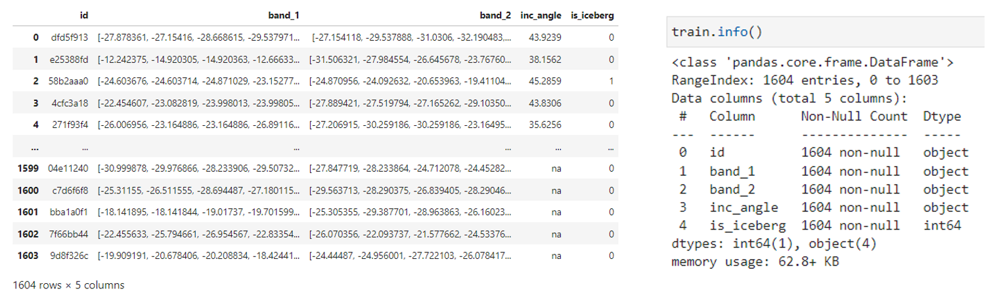

* test.json

![image.png](attachment:15fd8dad-ae99-42b9-8162-a7170e580e0e.png "test.json 확인")
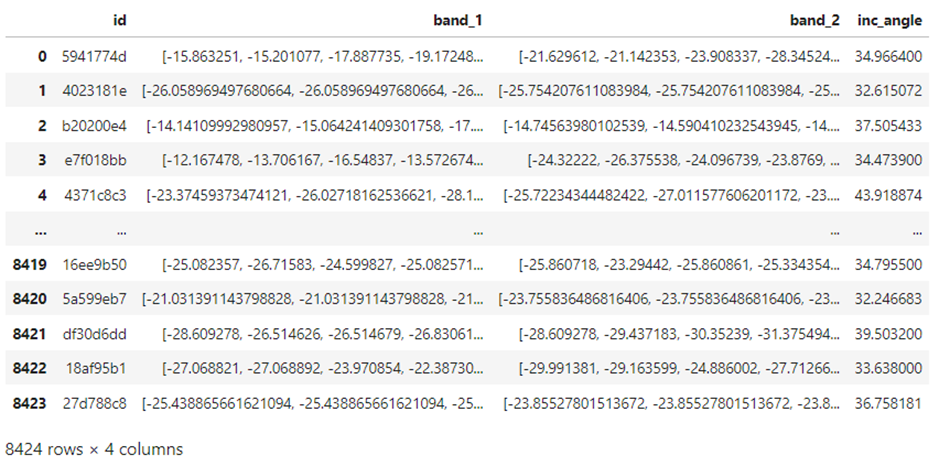

=> test data의 양이 train의 8배?..

### 🔸 Visualization

Visualization에서 특별한 점은 찾을 수 없었고 inc_angle이 30~45에 분포해있었기 때문에 "na"값을 으로 대체

![image.png](attachment:4a1a27cb-1cf6-4658-8e56-32d8d5d4e82e.png "간단한 분포 Visualization")
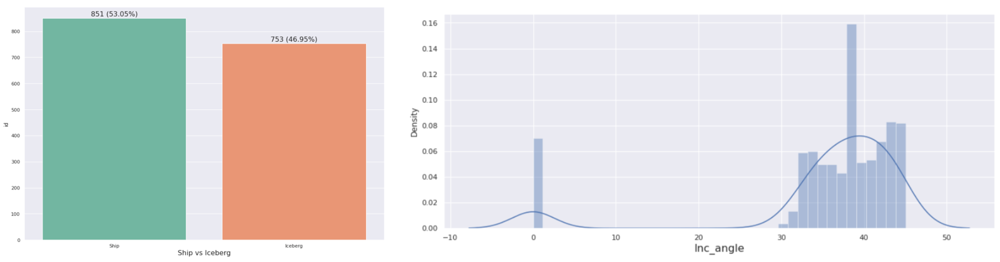

### 🔸 band_1, band_2 이미지로 visualization

* Train data Viz

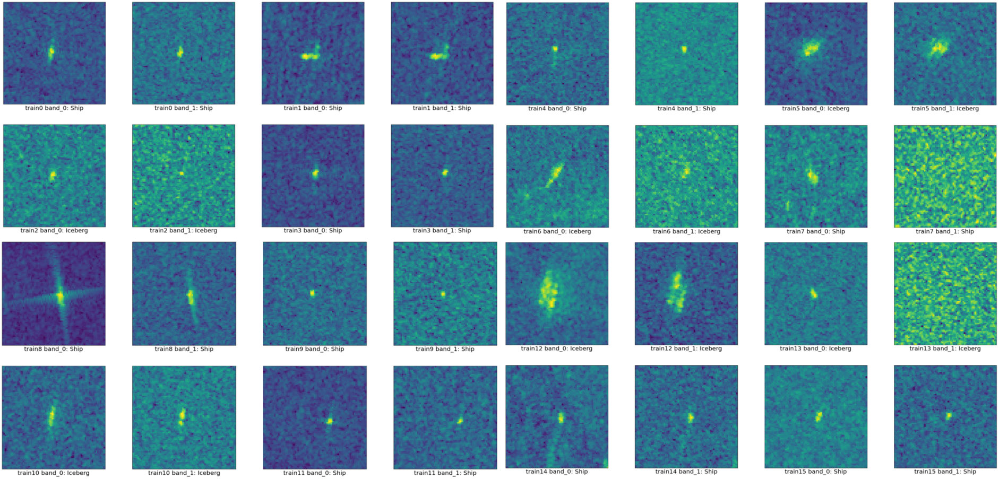

* Test data Viz
=> Train data에 비해서 data가 영... **Augmentation**이 필수라는 생각
<br>Competition의 data 설명에 나온 아래와 같은 부분에 해당하는 것 같음.
> Please note that we have included machine-generated images in the test set to prevent hand labeling. They are excluded in scoring. 

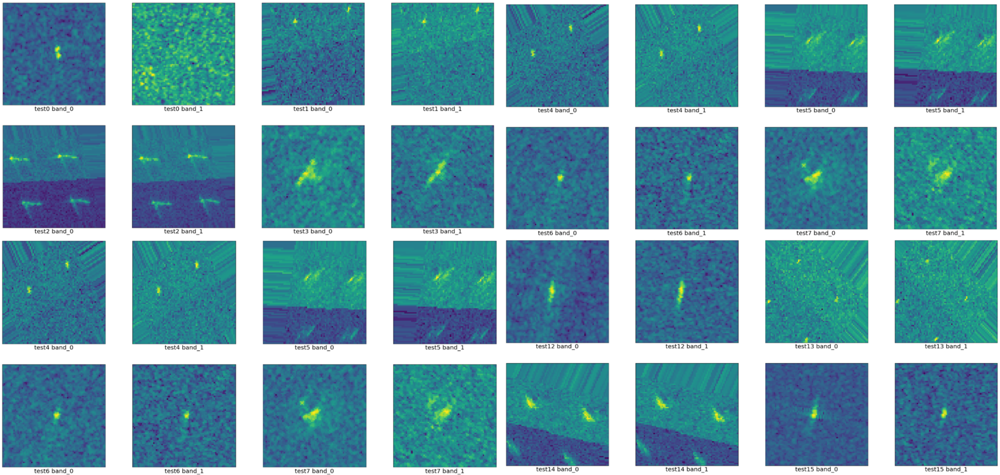

## Data의 Pattern(1): 3D Plot
---

간단한 Visualization과 EDA를 하고 나서 처음에 아무 아이디어가 들지를 않아서 우선적으로 most popular Notebook을 참고해봄

### 🔸 Most Popular Notebook

1. band_1과 band_2, 두 개의 backscatter를 동시에 보며 RGB와 같이 3개의 channel로 만들어주기 위해 **[band_1, band_2, 두 개의 평균]으로 data channel을 구성**함

In [ ]:
X_band_1 = np.array([np.array(band).astype(np.float32).reshape(75, 75) for band in train["band_1"]])
X_band_2 = np.array([np.array(band).astype(np.float32).reshape(75, 75) for band in train["band_2"]])

X_train = np.concatenate([X_band_1[:,:,:,np.newaxis], X_band_2[:,:,:,np.newaxis], ((X_band_1+X_band_2)/2)[:,:,:,np.newaxis]], axis=-1)

2. band를 3D plot으로 시각화하여 pattern 찾기

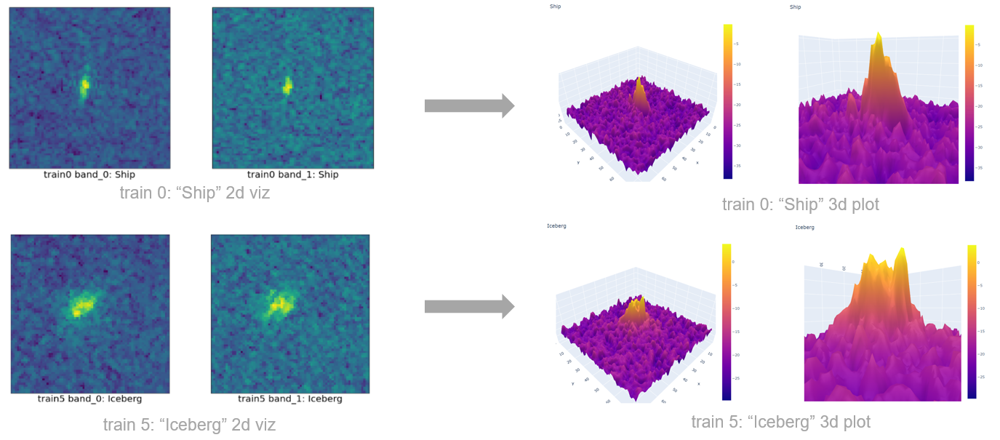

=> 3D로 plot해보면 “Ship”은 길쭉하게(더 뾰족하게) 뻗어나오고 “Iceberg”는 덜 뾰족하고 산처럼 울퉁불퉁하게 뻗어나오는 특징을 분석할 수 있음.

## Data의 Pattern(2): Graphics
---

Notebook 하나를 참고해서 보다보니까, 이렇게 잘 모르겠는 data를 보면 Pattern을 찾아보는 게 좋은 방법일거라는 생각
<br>=> Data를 계속 뜯어보고 시각화하다보니 **Graphics 관점**으로 접근하게 되었음. 

앞서 방법은 3D로 plot한거였는데, 그냥 **2D에서 pattern을 찾아볼 방법**은?

### 🔸 Graphics 관점으로 접근

1. Background / Object로 우선 나눠줘야하기 때문에 **grayscale**이 모델이 보기 좋지 않을까?

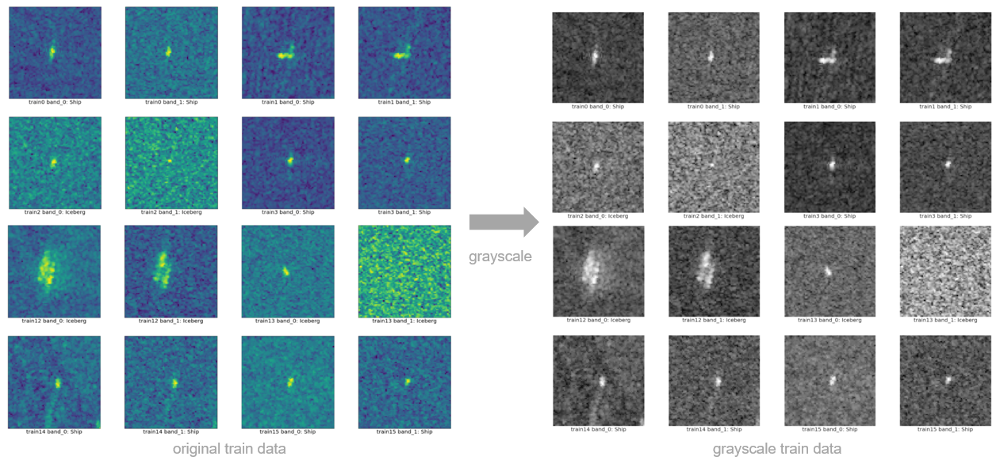

Background 분리 후에 object의 형태를 파악해야 하니까 **edge detection**이 효과있지 않을까? (grayscale 유지)

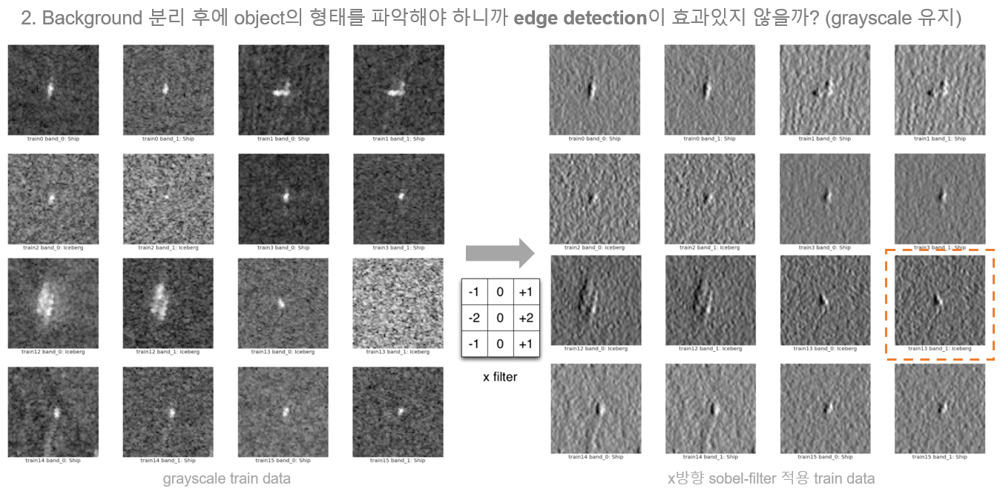

* **grayscale + x-sobel filter** 결과를 보니 model이 훨씬 보기 좋에 변환되며 **noise 제거**가 많이 되었고 noise에 가려 잘 보이진 object들이 드러나는 경향을 보임
* edge가 뚜렷하게 detection되는(Iceberg는 형태 자체가 뚜렷하지 않음) object의 경우가 “ship”일 확률이 컸음
<br> => 모델 성능을 올려보기에 충분히 좋은 방법일 것 같다는 생각

* y-sobel filter, prewitt, roberts, laplacian 등 다른 영상 처리 filter들을 사용해봤는데 다른 것들은 결과가 그닥 좋지 않다고 판단 되었음
<br> => Graphics의 관점으로 data를 처리해보는 게 pattern을 찾아내는 데는 좋지만 적절한 방법이 필요할 것 같음

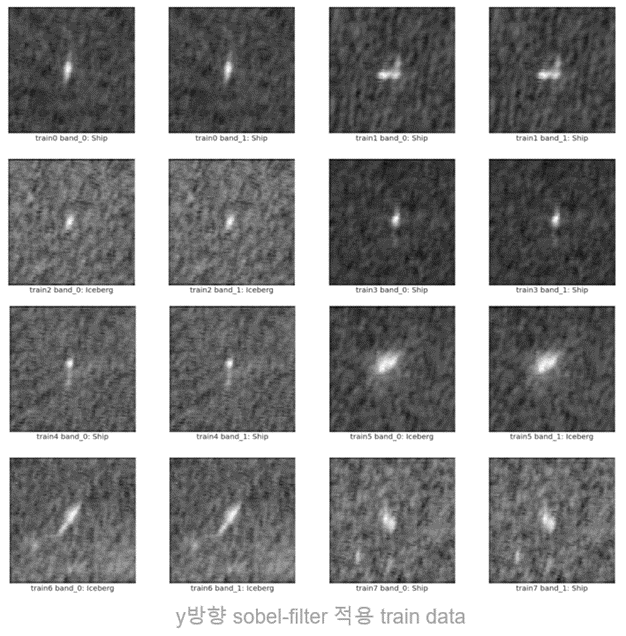

## Data의 Pattern(3): FFT
---

### 🔸 FFT: Fast Fourier Transform (고속 푸리에 변환)
시간 또는 공간 도메인에 대한 함수를 주파수 성분으로 분해하는 Fourier Transform중에서 discrete 입력 신호를 받는 DFT,Discrete Fourier Transform(이산 푸리에변환)과 그 역변환을 빠르게 수행하는 알고리즘
<br>=> 주파수 영역에서 시각화하여 해석이나 분석을 용이하게 해줌

* 2D 또는 3D로 활용할 게 아니라, 주파수 신호 자체로 사용했을 때 미세한 차이들을 감지하기 쉽지 않을까?
<br> => **주파수 데이터에서의 pattern**을 찾아내는 시도로 접근

1. Backscatter 자체로 Visualization
<br> => “Ship”과 “Iceberg”를 가지는 data의 band_1을 그래프로 먼저 시각화해보면, 이미 어느정도 차이를 갖고 있을 거라는 예상을 할 수가 있음

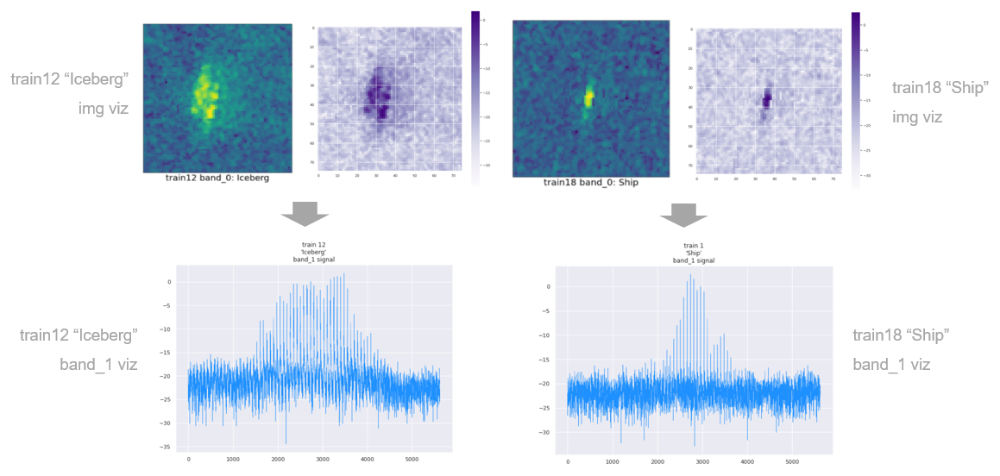

2. FFT 변환 후 다시 IFFT(Inverse-FFT)를 하여 변환 결과 시각화
<br> => **Background와 object가 더 극명하게 분리**되고 **ship과 iceberg의 차이가 두드러짐**을 확인할 수 있기 때문에 주파수 신호를 사용하는것이 모델 성능을 올리는데에 좋은 방법이 될 수 있을것으로 판단

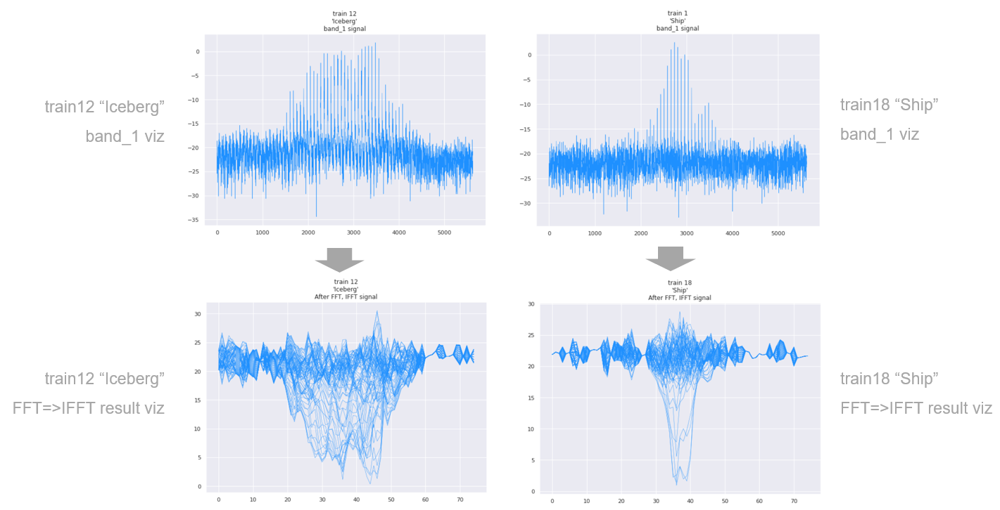